## This notebook is used for dataset NEON processing and YOLO models testing.

In [ ]:
!pip install -q torch torchvision torchaudio
!pip install -q DeepForest
!pip install -q rasterio matplotlib
!pip install -q rpy2

In [ ]:
%load_ext rpy2.ipython

Downloading the NEON dataset

In [ ]:
%%R
library(devtools)
devtools::install_github("Weecology/NeonTreeEvaluation_package")
library(NeonTreeEvaluation)
ls("package:NeonTreeEvaluation")

In [ ]:
%%R
download()

Parsing XML annotations and saving to CSV

In [ ]:
import os
import csv
import xml.etree.ElementTree as ET

image_dir = '/usr/local/lib/R/site-library/NeonTreeEvaluation/extdata/NeonTreeEvaluation/evaluation/RGB/'
xml_dir = '/usr/local/lib/R/site-library/NeonTreeEvaluation/extdata/NeonTreeEvaluation/annotations/'
output_csv = "annotations.csv"

# Getting lists of files
image_files = [f for f in os.listdir(image_dir) if f.endswith('.tif')]
xml_files = [f for f in os.listdir(xml_dir) if f.endswith('.xml')]

# Extracting base filenames
image_basenames = {os.path.splitext(f)[0]: f for f in image_files}
xml_basenames = {os.path.splitext(f)[0]: f for f in xml_files}

# Matching files
matching_files = image_basenames.keys() & xml_basenames.keys()

# Function to parse XML
def parse_xml(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    boxes = []
    for obj in root.findall("object"):
        bndbox = obj.find("bndbox")
        xmin = int(bndbox.find("xmin").text)
        ymin = int(bndbox.find("ymin").text)
        xmax = int(bndbox.find("xmax").text)
        ymax = int(bndbox.find("ymax").text)
        boxes.append([xmin, ymin, xmax, ymax])
    return boxes

# Creating CSV file
with open(output_csv, "w", newline="") as csvfile:
    writer = csv.writer(csvfile)
    # Writing headers
    writer.writerow(["image_path", "xmin", "ymin", "xmax", "ymax", "label"])

    # Processing matching files
    for basename in matching_files:
        image_path = os.path.join(image_dir, image_basenames[basename])
        xml_path = os.path.join(xml_dir, xml_basenames[basename])

        # Parsing annotations
        boxes = parse_xml(xml_path)

        # Writing annotations to CSV
        for box in boxes:
            writer.writerow([image_path, box[0], box[1], box[2], box[3], "Tree"])

print(f"CSV file saved: {output_csv}")


### Processing dataset NEON to conduct various experiments

Image augmentation and annotation update

In [ ]:
import os
import numpy as np
import pandas as pd
from PIL import Image, ImageEnhance
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

annotations_csv = "annotations.csv"  # CSV file with annotations
output_dir = os.path.join(os.getcwd(), "output_neon")  # Directory for saving data
augmented_dir = os.path.join(output_dir, "augmented_images")  # Folder for augmented images
os.makedirs(output_dir, exist_ok=True)
os.makedirs(augmented_dir, exist_ok=True)

# Function for image augmentation
def augment_image(image_path, output_dir, augment_count=6):
    """Creates multiple augmented copies of an image."""
    base_name = os.path.basename(image_path)
    name, ext = os.path.splitext(base_name)

    with Image.open(image_path) as image:
        augmented_paths = []
        width, height = image.size

        for i in range(augment_count):
            # Applying different types of augmentation
            aug_image = image.copy()

            if i == 0:
                aug_image = aug_image.transpose(Image.FLIP_LEFT_RIGHT)  # Horizontal flip
                transform_type = "flip_lr"
            elif i == 1:
                enhancer = ImageEnhance.Contrast(aug_image)  # Adjust contrast
                aug_image = enhancer.enhance(1.5)  # Increase contrast
                transform_type = "increase_contrast"
            elif i == 2:
                enhancer = ImageEnhance.Brightness(aug_image)  # Adjust brightness
                aug_image = enhancer.enhance(1.2)  # Increase brightness
                transform_type = "brightness_increase"
            elif i == 3:
                enhancer = ImageEnhance.Brightness(aug_image)  # Adjust brightness
                aug_image = enhancer.enhance(0.8)  # Decrease brightness
                transform_type = "brightness_decrease"
            elif i == 4:
                enhancer = ImageEnhance.Contrast(aug_image)  # Adjust contrast
                aug_image = enhancer.enhance(0.8)  # Decrease contrast
                transform_type = "decrease_contrast"
            elif i == 5:
                aug_image = aug_image.transpose(Image.FLIP_TOP_BOTTOM)  # Vertical flip
                transform_type = "flip_tb"

            # Save augmented image
            aug_path = os.path.join(output_dir, f"{name}_aug{i}{ext}")
            aug_image.save(aug_path)
            augmented_paths.append((aug_path, transform_type, width, height))

    return augmented_paths

# Function to update annotations
def adjust_annotations(image_annotations, transform_type, image_width, image_height):
    updated_annotations = []
    for _, row in image_annotations.iterrows():
        x_min, y_min, x_max, y_max = row["xmin"], row["ymin"], row["xmax"], row["ymax"]

        if transform_type == "flip_lr":
            # Horizontal flip
            x_min, x_max = image_width - x_max, image_width - x_min
        elif transform_type == "flip_tb":
            # Vertical flip
            y_min, y_max = image_height - y_max, image_height - y_min

        # Add updated annotation to the list
        updated_annotations.append({
            "image_path": row["image_path"],
            "xmin": x_min,
            "ymin": y_min,
            "xmax": x_max,
            "ymax": y_max,
            "label": row["label"]
        })

    return pd.DataFrame(updated_annotations)

# Loading annotations
annotations = pd.read_csv(annotations_csv)

# Splitting into training and validation sets
image_paths = annotations["image_path"].unique()

np.random.seed(42)
valid_paths = np.random.choice(image_paths, int(len(image_paths) * 0.25), replace=False)

valid_annotations = annotations[annotations["image_path"].isin(valid_paths)]
train_annotations = annotations[~annotations["image_path"].isin(valid_paths)]

# List for new augmented annotations
augmented_annotations = []

# Getting paths of training images
train_paths = train_annotations["image_path"].unique()

# Applying augmentation only to training images
for image_path in train_paths:
    # Finding annotations for the current image
    image_annotations = train_annotations[train_annotations["image_path"] == image_path]

    # Creating augmented copies of the image
    augmented_data = augment_image(image_path, augmented_dir)

    # Creating annotations for augmented images
    for aug_path, transform_type, width, height in augmented_data:
        if transform_type:
            aug_annots = adjust_annotations(image_annotations, transform_type, width, height)
        else:
            aug_annots = image_annotations.copy()

        aug_annots["image_path"] = aug_path
        augmented_annotations.append(aug_annots)

# Adding augmented annotations to original
if augmented_annotations:
    augmented_annotations_df = pd.concat(augmented_annotations, ignore_index=True)
    train_annotations = pd.concat([train_annotations, augmented_annotations_df], ignore_index=True)


train_csv_NEON = os.path.join(output_dir, "train_NEON.csv")
valid_csv_NEON = os.path.join(output_dir, "valid_NEON.csv")
train_annotations.to_csv(train_csv_NEON, index=False)
valid_annotations.to_csv(valid_csv_NEON, index=False)


Displaying augmented images with annotations

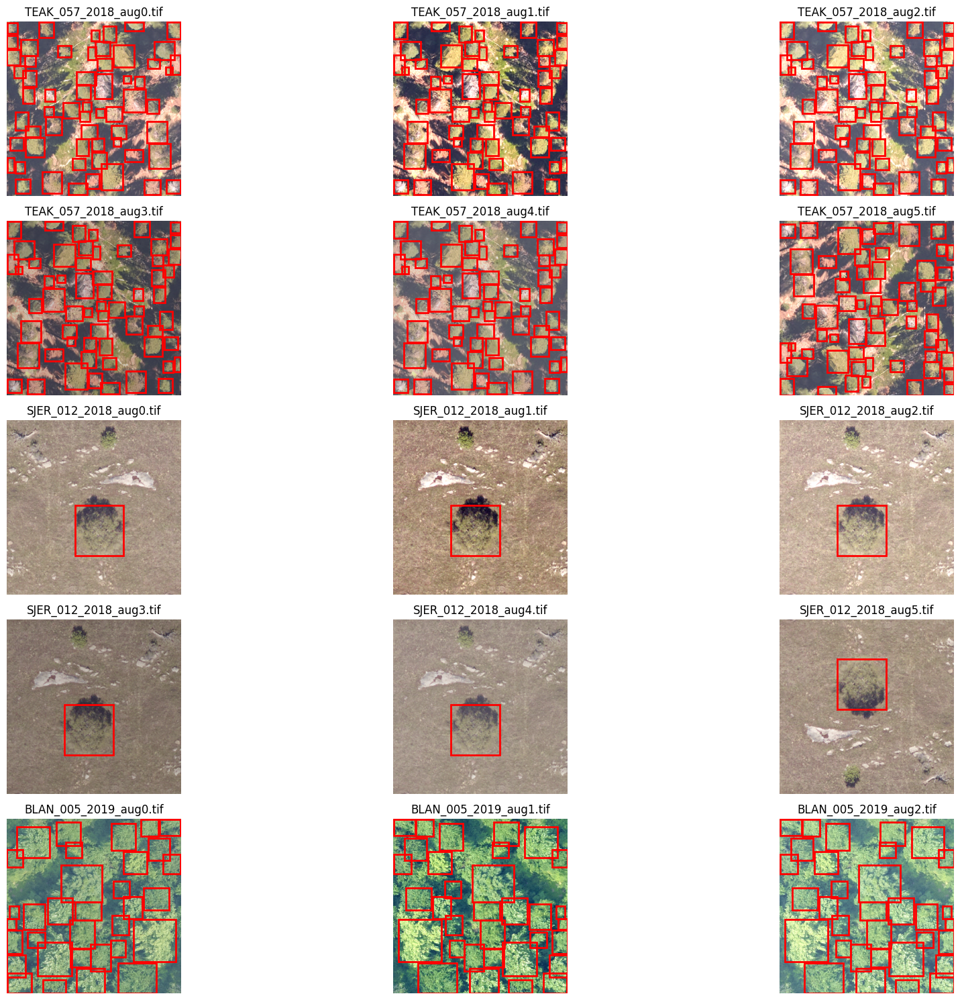

In [ ]:
# Filteing only augmented images
augmented_images = train_annotations[train_annotations["image_path"].str.contains("_aug")]["image_path"].unique()

# Selecting augmented images
sample_augmented_images = augmented_images[:15]

# Function to display images with annotations
def show_image_with_annotations(image_path, annotations):

    img = Image.open(image_path)
    plt.imshow(img)
    plt.axis('off')

    for _, row in annotations.iterrows():
        xmin, ymin, xmax, ymax = row['xmin'], row['ymin'], row['xmax'], row['ymax']
        # Drawing a rectangle around the annotated object
        plt.gca().add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                          linewidth=2, edgecolor='r', facecolor='none'))

    plt.title(os.path.basename(image_path))

# Displaying several augmented images with bounding boxes
plt.figure(figsize=(20, 15))

for i, img_path in enumerate(sample_augmented_images):
    # Finding annotations for the current image
    image_annotations = train_annotations[train_annotations['image_path'] == img_path]

    plt.subplot(5, 3, i + 1)
    show_image_with_annotations(img_path, image_annotations)

plt.tight_layout()
plt.show()


In [ ]:
# Checking the number of rows in files after saving
train_annotations_loaded = pd.read_csv(train_csv_NEON)
valid_annotations_loaded = pd.read_csv(valid_csv_NEON)

print(f"The number of annotations in {train_csv_NEON} after saving: {len(train_annotations_loaded)}")
print(f"The number of annotations in {valid_csv_NEON} after saving: {len(valid_annotations_loaded)}")


### Converting annotations to YOLO format

In [ ]:
import os
import shutil
import pandas as pd
from PIL import Image

train_csv = "/content/output/train.csv"  # Path to CSV with training annotations
valid_csv = "/content/output/valid.csv"  # Path to CSV with validation annotations

train_annotation_dir = "/content/yolo/train/labels"  # Directory for YOLO annotations (training)
valid_annotation_dir = "/content/yolo/valid/labels"  # Directory for YOLO annotations (validation)
train_image_dir = "/content/yolo/train/images"  # Directory for training images
valid_image_dir = "/content/yolo/valid/images"  # Directory for validation images

# Defining image directories
train_image_base_dir_1 = "/usr/local/lib/R/site-library/NeonTreeEvaluation/extdata/NeonTreeEvaluation/evaluation/RGB/"
train_image_base_dir_2 = "/content/output/augmented_images/"
valid_image_base_dir = "/usr/local/lib/R/site-library/NeonTreeEvaluation/extdata/NeonTreeEvaluation/evaluation/RGB/"

# Creating directories for YOLO
os.makedirs(train_annotation_dir, exist_ok=True)
os.makedirs(valid_annotation_dir, exist_ok=True)
os.makedirs(train_image_dir, exist_ok=True)
os.makedirs(valid_image_dir, exist_ok=True)

# Loading annotations from CSV
train_annotations = pd.read_csv(train_csv)
valid_annotations = pd.read_csv(valid_csv)

# Defining a function for converting annotations to YOLO format
def convert_annotations_to_yolo_format(annotations, image_dir, annotation_dir, image_base_dirs):
    class_mapping = {"Tree": 0}

    # Grouping annotations by image
    grouped_annotations = annotations.groupby("image_path")

    for image_path, group in grouped_annotations:
        image_filename = os.path.basename(image_path)

        # Defining the path for YOLO annotation
        yolo_annotation_path = os.path.join(annotation_dir, os.path.splitext(image_filename)[0] + ".txt")

        # Finding the correct base directory for the image
        image_base_dir = next((d for d in image_base_dirs if os.path.exists(os.path.join(d, image_path))), None)
        if image_base_dir is None:
            print(f"Error: Image {image_path} not found ")
            continue

        # Setting the full image path
        full_image_path = os.path.join(image_base_dir, image_path)

        # Opening the image for retrieving dimensions
        with Image.open(full_image_path) as img:
            image_width, image_height = img.size

        # Writing annotations to a file
        with open(yolo_annotation_path, "w") as f:
            for _, row in group.iterrows():
                x_min, y_min, x_max, y_max = row["xmin"], row["ymin"], row["xmax"], row["ymax"]
                label = class_mapping[row["label"]]

                # Converting coordinates to YOLO format
                x_center = (x_min + x_max) / 2.0
                y_center = (y_min + y_max) / 2.0
                width = x_max - x_min
                height = y_max - y_min

                # Normalizing coordinates
                x_center /= image_width
                y_center /= image_height
                width /= image_width
                height /= image_height

                f.write(f"{label} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}\n")

        # Copying the image to the corresponding directory
        shutil.copy(full_image_path, os.path.join(image_dir, image_filename))

# Converting annotations for training data
convert_annotations_to_yolo_format(train_annotations, train_image_dir, train_annotation_dir, [train_image_base_dir_1, train_image_base_dir_2])

# Converting annotations for validation data
convert_annotations_to_yolo_format(valid_annotations, valid_image_dir, valid_annotation_dir, [valid_image_base_dir])

print("Annotations successfully converted to YOLO format and images copied.")


### Cloning and setting up YOLOv5 for testing

In [ ]:
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5

!pip install -r requirements.txt

# Testing YOLO models with different parameters

### Finding the optimal model parameters for image size 420


In [ ]:
!python /content/yolov5/train.py --img 420 --batch 32 --epochs 20 --data /content/dataset21_01.yaml --weights yolov5s.pt --evolve

### Testing models using file hyp_evolve_3.yaml with optimal parameters

In [ ]:
!python /content/yolov5/train.py --img 420 --batch 32 --epochs 100 --data /content/dataset21_01.yaml --weights yolov5s.pt --hyp /content/hyp_evolve_3.yaml

Выходные данные были обрезаны до нескольких последних строк (5000).
      27/99      3.71G    0.07565     0.2301          0       1911        448:  72% 23/32 [00:03<00:01,  7.69it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      3.71G    0.07566     0.2291          0       1747        448:  75% 24/32 [00:03<00:01,  7.49it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      3.71G      0.076      0.231          0       2889        448:  78% 25/32 [00:03<00:00,  7.72it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      3.7

In [ ]:
!python /content/yolov5/train.py --img 420 --batch 32 --epochs 100 --data /content/dataset21_01.yaml --weights yolov5m.pt --hyp /content/hyp_evolve_3.yaml

Выходные данные были обрезаны до нескольких последних строк (5000).
      27/99      6.73G    0.07021     0.2142          0       1911        448:  72% 23/32 [00:05<00:02,  4.18it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      6.73G    0.07022     0.2132          0       1747        448:  75% 24/32 [00:05<00:01,  4.09it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      6.73G    0.07059     0.2153          0       2889        448:  78% 25/32 [00:06<00:01,  4.16it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      6.7

In [ ]:
!python /content/yolov5/train.py --img 420 --batch 16 --epochs 100 --data /content/dataset21_01.yaml --weights yolov5s.pt --hyp /content/hyp_evolve_3.yaml

Выходные данные были обрезаны до нескольких последних строк (5000).
  with torch.cuda.amp.autocast(amp):
      62/99      1.98G    0.06874     0.2154          0        786        448:  50% 32/64 [00:02<00:02, 11.89it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      62/99      1.98G    0.06849      0.215          0        760        448:  50% 32/64 [00:02<00:02, 11.89it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      62/99      1.98G    0.06867      0.217          0       1384        448:  53% 34/64 [00:02<00:02, 12.27it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.am

In [ ]:
!python /content/yolov5/train.py --img 420 --batch 16 --epochs 100 --data /content/dataset21_01.yaml --weights yolov5m.pt --hyp /content/hyp_evolve_3.yaml

Выходные данные были обрезаны до нескольких последних строк (5000).
  with torch.cuda.amp.autocast(amp):
      62/99      3.71G    0.06132      0.191          0        786        448:  50% 32/64 [00:03<00:03,  8.32it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      62/99      3.71G    0.06105     0.1905          0        760        448:  52% 33/64 [00:03<00:03,  8.32it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      62/99      3.71G     0.0612     0.1922          0       1384        448:  53% 34/64 [00:04<00:03,  8.24it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.am

In [ ]:
!python /content/yolov5/train.py --img 640 --batch 32 --epochs 100 --data /content/dataset21_01.yaml --weights yolov5s.pt --hyp /content/hyp_evolve_3.yaml

Выходные данные были обрезаны до нескольких последних строк (5000).
      27/99      7.23G    0.05795     0.3013          0       1962        640:  72% 23/32 [00:06<00:02,  3.82it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      7.23G    0.05799        0.3          0       1759        640:  75% 24/32 [00:06<00:02,  3.80it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      7.23G    0.05824      0.303          0       2906        640:  78% 25/32 [00:06<00:01,  3.86it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      7.2

In [ ]:
!python /content/yolov5/train.py --img 640 --batch 32 --epochs 100 --data /content/dataset21_01.yaml --weights yolov5m.pt --hyp /content/hyp_evolve_3.yaml

Выходные данные были обрезаны до нескольких последних строк (5000).
      27/99      13.7G     0.0514     0.2692          0       1962        640:  72% 23/32 [00:11<00:04,  2.01it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      13.7G    0.05141      0.268          0       1759        640:  75% 24/32 [00:11<00:04,  2.00it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      13.7G    0.05157     0.2709          0       2906        640:  78% 25/32 [00:12<00:03,  2.02it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      13.

### Finding the optimal model parameters for image size 640

In [ ]:
!python /content/yolov5/train.py --img 640 --batch 32 --epochs 20 --data /content/dataset21_01.yaml --weights yolov5s.pt --evolve

Выходные данные были обрезаны до нескольких последних строк (5000).
Logging results to runs/evolve/exp
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
  0% 0/32 [00:00<?, ?it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
       0/19      6.15G     0.1165     0.1902          0        922        640:   3% 1/32 [00:00<00:08,  3.60it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
       0/19      6.36G     0.1166     0.2035          0       1122        640:   6% 2/32 [00:00<00:11,  2.51it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead

### Testing models using file hyp_evolve_4.yaml with optimal parameters

In [ ]:
!python /content/yolov5/train.py --img 420 --batch 32 --epochs 100 --data /content/dataset21_01.yaml --weights yolov5s.pt --hyp /content/hyp_evolve_4.yaml

Выходные данные были обрезаны до нескольких последних строк (5000).
      27/99      3.71G    0.07319     0.1988          0       1115        448:  72% 23/32 [00:03<00:01,  7.57it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      3.71G    0.07333     0.1979          0       1003        448:  75% 24/32 [00:03<00:01,  7.29it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      3.71G    0.07334     0.1959          0        749        448:  78% 25/32 [00:03<00:00,  7.56it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      3.7

In [ ]:
!python /content/yolov5/train.py --img 420 --batch 32 --epochs 100 --data /content/dataset21_01.yaml --weights yolov5m.pt --hyp /content/hyp_evolve_4.yaml

Выходные данные были обрезаны до нескольких последних строк (5000).
      27/99      6.73G    0.06999     0.1907          0       1115        448:  72% 23/32 [00:05<00:02,  4.18it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      6.73G    0.07013     0.1898          0       1003        448:  75% 24/32 [00:05<00:01,  4.08it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      6.73G    0.07016     0.1879          0        749        448:  78% 25/32 [00:06<00:01,  4.16it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      6.7

In [ ]:
!python /content/yolov5/train.py --img 420 --batch 16 --epochs 100 --data /content/dataset21_01.yaml --weights yolov5s.pt --hyp /content/hyp_evolve_4.yaml

Выходные данные были обрезаны до нескольких последних строк (5000).
  with torch.cuda.amp.autocast(amp):
      62/99      1.98G    0.06833     0.1883          0        682        448:  50% 32/64 [00:02<00:02, 12.19it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      62/99      1.98G    0.06852     0.1918          0        944        448:  50% 32/64 [00:02<00:02, 12.19it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      62/99      1.98G    0.06895     0.1948          0       1090        448:  53% 34/64 [00:02<00:02, 12.68it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.am

In [ ]:
!python /content/yolov5/train.py --img 420 --batch 16 --epochs 100 --data /content/dataset21_01.yaml --weights yolov5m.pt --hyp /content/hyp_evolve_4.yaml

Выходные данные были обрезаны до нескольких последних строк (5000).
  with torch.cuda.amp.autocast(amp):
      62/99      3.71G    0.06225     0.1707          0        682        448:  50% 32/64 [00:03<00:03,  8.42it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      62/99      3.71G    0.06251      0.174          0        944        448:  52% 33/64 [00:03<00:03,  8.53it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      62/99      3.71G    0.06294     0.1771          0       1090        448:  53% 34/64 [00:04<00:03,  8.60it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.am

In [ ]:
!python /content/yolov5/train.py --img 640 --batch 32 --epochs 100 --data /content/dataset21_01.yaml --weights yolov5s.pt --hyp /content/hyp_evolve_4.yaml

Выходные данные были обрезаны до нескольких последних строк (5000).
      27/99      7.23G    0.06033     0.2635          0       1118        640:  72% 23/32 [00:06<00:02,  3.87it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      7.23G    0.06043     0.2622          0       1006        640:  75% 24/32 [00:06<00:02,  3.82it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      7.23G     0.0605     0.2594          0        753        640:  78% 25/32 [00:06<00:01,  3.87it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      7.2

In [ ]:
!python /content/yolov5/train.py --img 640 --batch 32 --epochs 100 --data /content/dataset21_01.yaml --weights yolov5m.pt --hyp /content/hyp_evolve_4.yaml

Выходные данные были обрезаны до нескольких последних строк (5000).
      27/99      13.7G     0.0568     0.2487          0       1118        640:  72% 23/32 [00:11<00:04,  2.02it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      13.7G    0.05686     0.2476          0       1006        640:  75% 24/32 [00:11<00:04,  1.99it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      13.7G    0.05696      0.245          0        753        640:  78% 25/32 [00:12<00:03,  2.01it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      13.

In [ ]:
!python /content/yolov5/train.py --img 640 --batch 32 --epochs 10 --data /content/dataset21_01.yaml --weights yolov5s.pt --evolve

Выходные данные были обрезаны до нескольких последних строк (5000).
  with torch.cuda.amp.autocast(amp):
        4/9      6.37G    0.07269     0.3162          0       1519        640:  53% 17/32 [00:04<00:04,  3.75it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
        4/9      6.37G    0.07254     0.3149          0       1347        640:  56% 18/32 [00:04<00:03,  3.70it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
        4/9      6.37G     0.0729     0.3138          0       1629        640:  59% 19/32 [00:05<00:03,  3.75it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.am

In [ ]:
!python /content/yolov5/train.py --img 420 --batch 32 --epochs 100 --data /content/dataset21_01.yaml --weights yolov5s.pt --hyp /content/hyp_evolve_5.yaml

Выходные данные были обрезаны до нескольких последних строк (5000).
      27/99      3.71G    0.07348     0.2423          0       2203        448:  72% 23/32 [00:03<00:01,  7.44it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      3.71G    0.07362     0.2409          0       1937        448:  75% 24/32 [00:03<00:01,  7.09it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      3.71G    0.07384     0.2403          0       1957        448:  78% 25/32 [00:03<00:00,  7.26it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      3.7

In [ ]:
!python /content/yolov5/train.py --img 420 --batch 32 --epochs 100 --data /content/dataset21_01.yaml --weights yolov5m.pt --hyp /content/hyp_evolve_5.yaml

Выходные данные были обрезаны до нескольких последних строк (5000).
      27/99      6.73G    0.06838     0.2249          0       2203        448:  72% 23/32 [00:05<00:02,  4.07it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      6.73G    0.06852     0.2234          0       1937        448:  75% 24/32 [00:05<00:02,  4.00it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      6.73G    0.06874      0.223          0       1957        448:  78% 25/32 [00:06<00:01,  4.09it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      6.7

In [ ]:
!python /content/yolov5/train.py --img 420 --batch 16 --epochs 100 --data /content/dataset21_01.yaml --weights yolov5s.pt --hyp /content/hyp_evolve_5.yaml

Выходные данные были обрезаны до нескольких последних строк (5000).
  with torch.cuda.amp.autocast(amp):
      62/99      1.98G    0.06888     0.2393          0        927        448:  50% 32/64 [00:02<00:03, 10.58it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      62/99      1.98G    0.06893     0.2374          0        875        448:  50% 32/64 [00:02<00:03, 10.58it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      62/99      1.98G    0.06855      0.236          0        695        448:  53% 34/64 [00:03<00:02, 10.76it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.am

In [ ]:
!python /content/yolov5/train.py --img 420 --batch 16 --epochs 100 --data /content/dataset21_01.yaml --weights yolov5m.pt --hyp /content/hyp_evolve_5.yaml

Выходные данные были обрезаны до нескольких последних строк (5000).
  with torch.cuda.amp.autocast(amp):
      62/99      3.71G    0.06211     0.2126          0        927        448:  50% 32/64 [00:03<00:03,  8.20it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      62/99      3.71G    0.06217      0.211          0        875        448:  52% 33/64 [00:04<00:03,  8.33it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      62/99      3.71G    0.06176     0.2094          0        695        448:  53% 34/64 [00:04<00:03,  8.43it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.am

In [ ]:
!python /content/yolov5/train.py --img 640 --batch 32 --epochs 100 --data /content/dataset21_01.yaml --weights yolov5s.pt --hyp /content/hyp_evolve_5.yaml

Выходные данные были обрезаны до нескольких последних строк (5000).
      27/99      7.23G    0.05822     0.3159          0       2230        640:  72% 23/32 [00:06<00:02,  3.73it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      7.23G    0.05833     0.3139          0       1953        640:  75% 24/32 [00:06<00:02,  3.65it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      7.23G    0.05845     0.3135          0       1973        640:  78% 25/32 [00:06<00:01,  3.71it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      7.2

In [ ]:
!python /content/yolov5/train.py --img 640 --batch 32 --epochs 100 --data /content/dataset21_01.yaml --weights yolov5m.pt --hyp /content/hyp_evolve_5.yaml

Выходные данные были обрезаны до нескольких последних строк (5000).
      27/99      13.7G     0.0521     0.2825          0       2230        640:  72% 23/32 [00:11<00:04,  1.99it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      13.7G    0.05215     0.2808          0       1953        640:  75% 24/32 [00:12<00:04,  1.97it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      13.7G    0.05225     0.2806          0       1973        640:  78% 25/32 [00:12<00:03,  1.99it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      27/99      13.